Mystery #1:
    - Why is distribution of new noise 1 different from original noise; it's shifted DOWN uniformly in the histogram?!?

# Overview

In this notebook, we examine different ways to generate noise signals.

We look at these methods of noise simulation:
- Random numbers using the white noise value
- Flat PS at the white noise value
- Noise map derived from variance maps
- Planck's official simulation (one of them)
- A realization of a map based on the $N_\ell$ of Planck's official simulation
- Half-Mission difference

## Data Sources

Accessing maps:
From [Planck Legacy Archive](https://pla.esac.esa.int/#maps)
- Maps (Leftmost icon)
- Advanced Search & Map Operations (Second wide row)
- Simulated Map Search (tab at top of this section)
- Choose Noise from list of categories at left
- Period: "full" (not "Full", which is empty with all other options)
- Instrument: "HFI" or "LFI"
- Frequency: All work


From [Planck Wiki](https://wiki.cosmos.esa.int/planck-legacy-archive/index.php/Simulation_data):
- Can instead get direct link by changing:
`http://pla.esac.esa.int/pla/aio/product-action?SIMULATED_MAP.FILE_ID=ffp10_noise_{frequency}_{ring_cut}_map_mc_{realization}.fits`


In [1]:
from dataclasses import dataclass
import requests
from pathlib import Path
from typing import List

from astropy.io import fits
from astropy.cosmology import Planck15
from astropy.units import Unit
import pysm3.units as u
import healpy as hp
import numpy as np

import matplotlib.pyplot as plt
from cmbml.utils.physics_ps import get_auto_ps_result
from cmbml.utils.physics_beam import GaussianBeam, NoBeam
# from cmbml.utils.plot_ps import plot_ps
from cmbml.utils import fits_inspection as fits_inspect

from system_config import ASSETS_DIRECTORY

## Parameters

In [2]:
DETECTOR = 100

In [3]:
# All white noise levels from Planck 2018 I, Table 4
WHITE_NOISE_LEVELS = {  # in K_CMB deg (I'm not sure how to handle the degrees part)
    30: 2.5,
    44: 2.7,
    70: 3.5,
    100: 1.29,
    143: 0.55,
    217: 0.78,
    353: 2.56,
    545: 0.78,  # In kJy / sr
    857: 0.72,  # In kJy / sr
}

CENTER_FREQS = {
    30: 28.4,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    44: 44.1,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    70: 70.4,      # Value from Planck DeltaBandpassTable & Planck 2018 I, Table 4
    100: 100.89,   # Value from Planck DeltaBandpassTable
    143: 142.876,  # Value from Planck DeltaBandpassTable
    217: 221.156,  # Value from Planck DeltaBandpassTable
    353: 357.5,    # Value from Planck DeltaBandpassTable
    545: 555.2,    # Value from Planck DeltaBandpassTable
    857: 866.8,    # Value from Planck DeltaBandpassTable
}

In [4]:
if DETECTOR in [30, 44, 70, 100, 143, 217, 353]:
    MAP_UNIT = "$\\mu K_{CMB}$"
elif DETECTOR in [545, 857]:
    MAP_UNIT = "$kJy sr^{-1}$"
    raise NotImplementedError("Units for 545 and 857 GHz are not yet implemented.")
else:
    raise NotImplementedError("Only first seven Planck detectors are implemented.")

In [5]:
def get_lmax_for_nside(nside):
    """Helper function: Max ell for a given nside; to be considered a parameter"""
    return 3 * nside - 1
def get_lmax_for_map(some_map):
    """Helper function: Max ell for a given map; to be considered a parameter"""
    return get_lmax_for_nside(hp.get_nside(some_map))

In [6]:
# Filenames and URL information

# For Planck's observations
planck_obs_fn = "{instrument}_SkyMap_{frequency}_{obs_nside}_{rev}_full.fits"

# For Planck's Simulated Noise Maps
planck_noise_fn_template = "ffp10_noise_{frequency}_{ring_cut}_map_mc_{realization}.fits"
url_template_sims = "http://pla.esac.esa.int/pla/aio/product-action?SIMULATED_MAP.FILE_ID={fn}"

# For Half-Mission Maps
hm_map_fn_template = "{instrument}_SkyMap_{freq}_2048_R3.01_halfmission-{hm}.fits"
url_template_maps = "http://pla.esac.esa.int/pla/aio/product-action?MAP.MAP_ID={fn}"

def format_freq(freq):
    return "{:.0f}".format(freq).zfill(3)

def format_real(real):
    return "{:.0f}".format(real).zfill(5)

def get_map_data(fn, source_url_template):
    """Load map data from a file, downloading it if necessary."""
    dest_path = Path(ASSETS_DIRECTORY) / fn
    need_to_dl = False
    if not dest_path.exists():
        print(f"File {dest_path} does not exist; downloading.")
        need_to_dl = True
    elif dest_path.stat().st_size < 1024:  # If the file is less than 1KB, it's a placeholder file
        print(f"File {dest_path} has placeholder file; redownloading.")
        need_to_dl = True
    else:
        print(f"File {dest_path} exists.")
    if need_to_dl:
        response = requests.get(source_url_template.format(fn=fn))
        with open(fn, "wb") as file:
            file.write(response.content)
        print(f"Downloaded {fn}")

In [7]:
prop_cycle = plt.rcParams['axes.prop_cycle']
mpl_colors = prop_cycle.by_key()['color']
del prop_cycle  # clean up namespace

In [8]:
@dataclass
class Record:
    name: str
    label: str
    sky: np.ndarray
    dl: np.ndarray
    color: str
    def __str__(self) -> str:
        return f"{self.name}: {self.label}, color: {self.color}"
    def __repr__(self) -> str:
        return self.__str__()


class Records:
    def __init__(self):
        self.r = {}
    def get(self, id):
        if isinstance(id, str):
            return self.get_by_name(id)
        elif isinstance(id, int):
            return self.get_by_idx(id)
        else:
            raise ValueError(f"Invalid id {id}")
    def get_by_name(self, name):
        return self.r[name]
    def get_by_idx(self, idx):
        return list(self.r.values())[idx]
    def add(self, name, label, sky, dl):
        if name in self.r:
            new_color_n = self.get(name).color
        else:
            new_color_n = len(self.r)
        self.r[name] = Record(name, label, sky, dl, mpl_colors[new_color_n])
    def add_record(self, record):
        record = Record(record.name, record.label, record.sky, record.dl, mpl_colors[len(self.r)])
        self.r[record.name] = record
    def get_labels(self, ids):
        return [self.get(id).label for id in ids]
    def get_colors(self, ids):
        return [self.get(id).color for id in ids]
    def get_skys(self, ids):
        return [self.get(id).sky for id in ids]
    def get_dls(self, ids):
        return [self.get(id).dl for id in ids]
    def get_many(self, ids):
        return [self.get(id) for id in ids]
    def get_all(self):
        return list(self.r.values())
    def __str__(self) -> str:
        if len(self.r) == 0:
            return "No records."
        for r in self.r.values():
            return "\n".join([str(r) for r in self.r.values()])
    def __repr__(self) -> str:
        return self.__str__()
    def __iter__(self):
        return iter(self.r.values())

In [9]:
recs = Records()

In [10]:
def plot_ps(many_ps_list, 
            labels, 
            # signal_type=None, 
            title=None, 
            xlim_low=None, ylim_low=None,
            xlim=None, ylim=None, 
            colors=None, 
            has_theory=False,
            loglog=True,
            scatter=True,
            helper_funcs=None):
    if not isinstance(many_ps_list, list):
        many_ps_list = [many_ps_list]
    if not isinstance(labels, list):
        labels = [labels]
    if not isinstance(colors, list):
        colors = [colors]
    # if signal_type == "noise":
    # title = title if title is not None else 'Noise Power Spectrum'
    y_label="$\\frac{\\ell(1+\\ell)}{2\\pi}N_{\\ell}(\\mu K^2)$"
    x_label="$\\ell$"
    # ylim=7000 if ylim is None else ylim
    # elif signal_type is None:
    #     signal_type = 'Power Spectrum'
    #     y_label="$D_{\\ell}(\\mu K^2)$"
    #     x_label="$\\ell$"
    #     xlim=3000 if xlim is None else xlim
    #     ylim=7000 if ylim is None else ylim
    # else: 
    #     raise NotImplementedError("This signal type is not implemented.")
    plt.figure()
    for i, (ps, label) in enumerate(zip(many_ps_list, labels)):
        if i == 0 and has_theory:
            style = '--'
            alpha = 1
        else:
            style = '-'
            alpha = 0.6
        color = colors[i] if colors is not None else None
        if scatter:
            ells = np.arange(len(ps))
            plt.scatter(x = ells, 
                        y = ps,
                        s=1,
                        label=label, 
                        color=color, 
                        alpha=alpha)
        else:
            plt.plot(ps, style, label=label, color=color, alpha=alpha)
    if isinstance(helper_funcs, list):
        for helper in helper_funcs:
            helper(plt)
    elif helper_funcs is not None:
        helper_funcs(plt)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    if loglog:
        plt.xscale('log')
        plt.yscale('log')
        if xlim_low is None:
            xlim_low = 1
        if ylim_low is None:
            ylim_low = 1
        plt.xlim([xlim_low, xlim])
        plt.ylim([ylim_low, ylim])
    else:
        plt.xlim([0, xlim])
        plt.ylim([0, ylim])
    plt.legend()
    plt.title(title)
    plt.show()

In [11]:
def make_histograms(records: Records, record_names_to_use: List[str], n_bins=100):
    oal_min = None
    oal_max = None
    for use_this in record_names_to_use:
        this_sky = records.get(use_this).sky
        this_min = this_sky.min()
        this_max = this_sky.max()
        oal_min = this_min if oal_min is None else min(oal_min, this_min)
        oal_max = this_max if oal_max is None else max(oal_max, this_max)
    bins = np.linspace(oal_min, oal_max, n_bins)

    plt.figure()
    for use_this in record_names_to_use:
        rec = records.get(use_this)
        plt.hist(rec.sky, bins=bins, alpha=0.5, label=rec.label, color=rec.color)
    plt.legend()
    plt.title("Histogram of Noise Maps by Pixel Count")
    plt.show()

In [12]:
# def display_map_helper(records, id=None):
#     """Shows a mollview map for a given record.
    
#     Parameters
#     ----------
#     records : Records
#         The records object containing the maps.
#     id : int or str
#         The index or name of the map to display.
#     """
#     if id is None:
#         rec = records.get_by_idx(-1)
#     else:
#         rec = records.get(id)
#     skymap = rec.sky
#     hp.mollview(skymap, unit=MAP_UNIT, title=rec.label)

# def display_ps_helper(records: Records, ids=None, helper_funcs=None):
#     if isinstance(ids, int):
#         ids = [ids]
#     elif ids is None:
#         ids = [-1]
#     plot_ps_s = [records.get(ids[i]).dl for i in ids]
#     labels = [records.get(ids[i]).label for i in ids]
#     colors = [records.get(ids[i]).color for i in ids]
#     plot_ps(plot_ps_s, labels=labels, colors=colors, signal_type='noise', helper_funcs=helper_funcs)

# White Noise, Simplest

In Planck 2018, I, Table 4, we find the temperature noise level for the 100 GHz detector: $1.29 \mu K_{CMB} deg$. The table also contains levels for all detectors and the polarization noise levels.

In [13]:
sigma_per_deg = WHITE_NOISE_LEVELS[DETECTOR]

nside = 2048
npix = hp.nside2npix(nside)

resol = hp.nside2resol(nside, arcmin=True) / 60  # u.degree
sigma_uK_CMB = sigma_per_deg / resol  # I think this is correct
# sigma_uK_CMB = sigma_per_deg

In [14]:
print(sigma_uK_CMB,resol**2*3600)

45.059121604299776 2.9506417214455087


In [15]:
np.random.seed(42)
wn_simplest_map = np.random.normal(0, sigma_uK_CMB, npix)
wn_simplest_map_1 = np.random.normal(0, 1, npix)*sigma_uK_CMB

In [16]:
def convert_cl_to_dl(cl, lmax):
    """Converts Cl to Dl"""
    return cl * (lmax * (lmax + 1)) / (2 * np.pi)

In [17]:
ell_max = hp.get_nside(wn_simplest_map) * 3 - 1
wn_simplest_map_cl = hp.anafast(wn_simplest_map, lmax=ell_max)
wn_simplest_map_cl_1 = hp.anafast(wn_simplest_map_1, lmax=ell_max)
wn_simplest_map_dl = convert_cl_to_dl(wn_simplest_map_cl, ell_max)
wn_simplest_map_dl_1 = convert_cl_to_dl(wn_simplest_map_cl_1, ell_max)

In [18]:
recs.add("wn_simplest", "Simplest White Noise", wn_simplest_map, wn_simplest_map_dl)
recs.add("wn_simplest_1", "Simplest White Noise 1", wn_simplest_map_1, wn_simplest_map_dl_1)

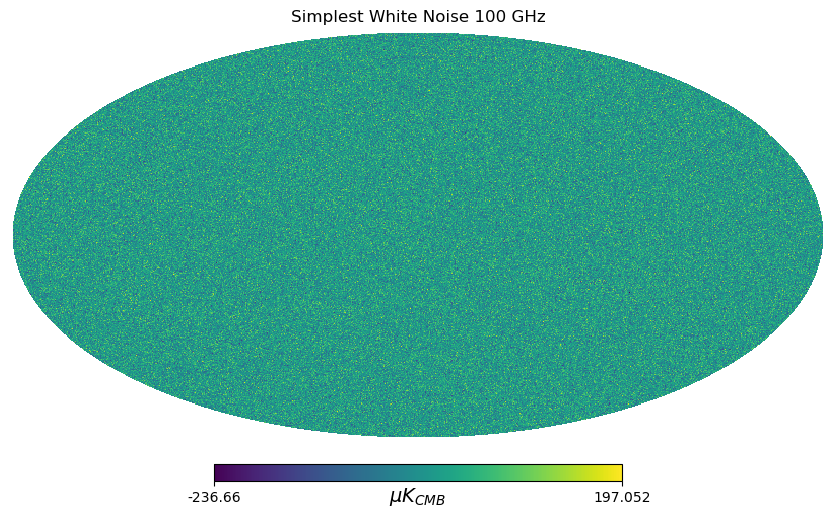

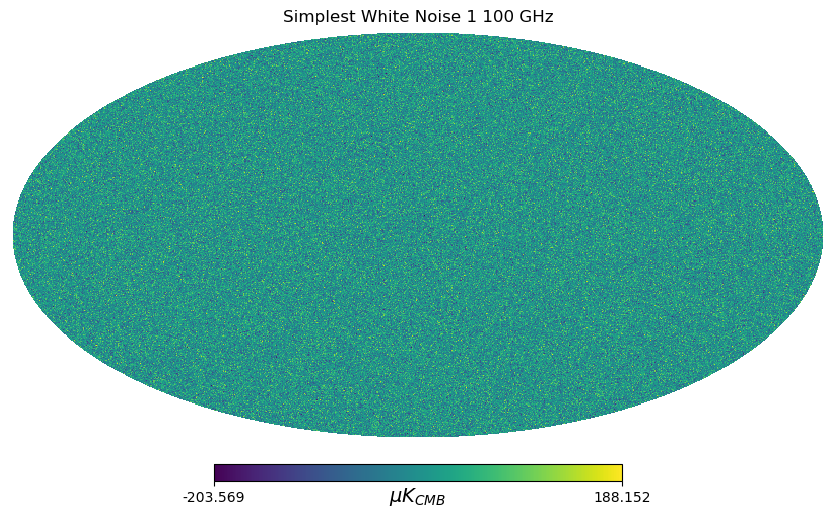

In [19]:
hp.mollview(wn_simplest_map, unit=MAP_UNIT, title=recs.get("wn_simplest").label + f" {DETECTOR} GHz")
hp.mollview(wn_simplest_map_1, unit=MAP_UNIT, title=recs.get("wn_simplest_1").label + f" {DETECTOR} GHz")

In [20]:
def make_noise_level_adder(sigma,reso):
    """Add white noise level to a map"""
    def add_noise_level(mpl_plt):
        mpl_plt.axhline(sigma**2/reso, color='red', linestyle='dashed')
    return add_noise_level

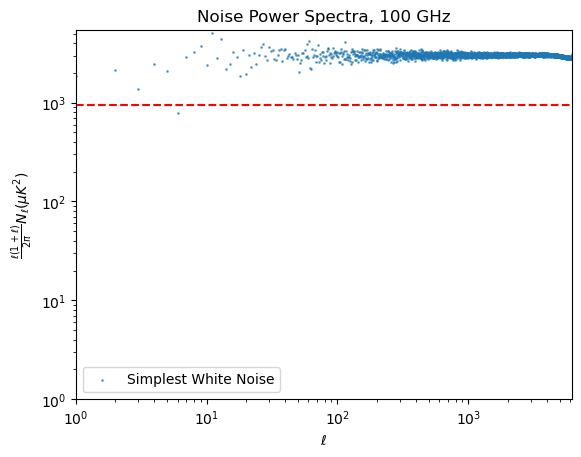

In [21]:
plot_ps(wn_simplest_map_dl,
        title=f"Noise Power Spectra, {DETECTOR} GHz",
        labels=recs.get("wn_simplest").label, 
        xlim=ell_max,
        colors=recs.get("wn_simplest").color,
        helper_funcs=make_noise_level_adder(sigma_uK_CMB, resol**2*2600))

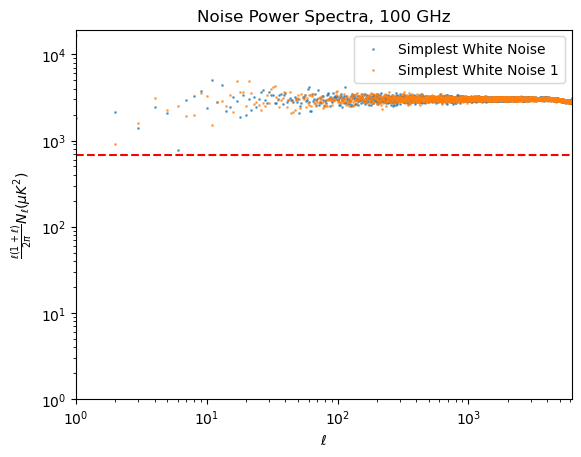

In [22]:
plot_ps([wn_simplest_map_dl, wn_simplest_map_dl_1],
        title=f"Noise Power Spectra, {DETECTOR} GHz",
        labels=[recs.get("wn_simplest").label, recs.get("wn_simplest_1").label], 
        xlim=ell_max,
        colors=[recs.get("wn_simplest").color, recs.get("wn_simplest_1").color],
        helper_funcs=make_noise_level_adder(sigma_uK_CMB, resol**2*3600))

In [36]:
def noise_model(simga, ell_knee, beta, ell):
    return simga * (1 + (ell_knee / ell)**beta)

sigma = 3.01124401e-04
beta = 2.03481394e+00
ell_knee = 1.86024866e+01
ell = np.arange(ell_max+1)
noise_model_ps = noise_model(sigma, ell_knee, beta, ell)
noise_model_ps[0] = 0
noise_model_map = hp.synfast(noise_model_ps, nside, new=True)

/tmp/ipykernel_72006/3227149808.py:2: RuntimeWarning: divide by zero encountered in divide
  return simga * (1 + (ell_knee / ell)**beta)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


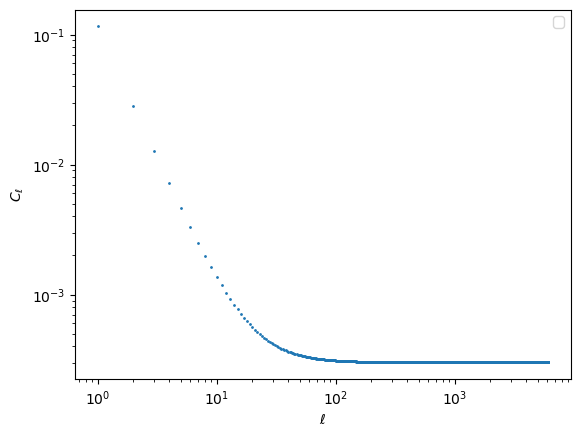

In [37]:
plt.figure()
plt.scatter(ell, noise_model_ps, s = 1)
plt.xscale('log')
plt.yscale('log')
plt.xlabel("$\\ell$")
plt.ylabel("$C_{\\ell}$")
plt.legend()
plt.show()

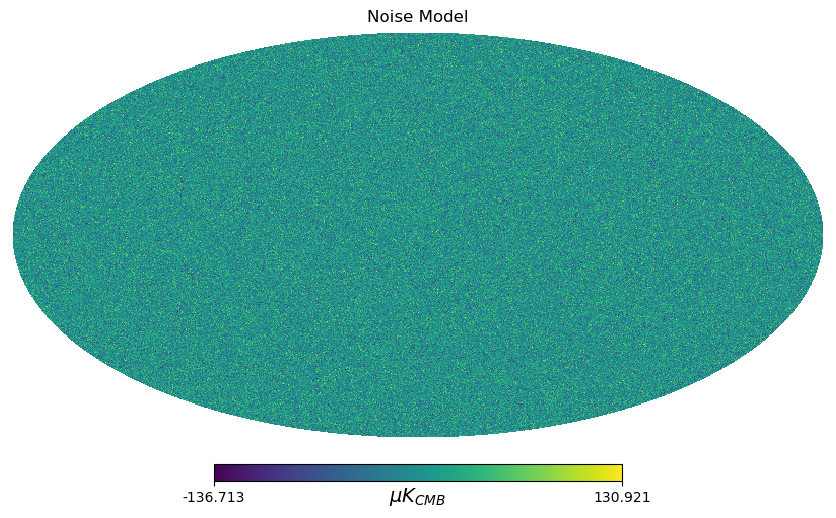

In [38]:
hp.mollview(noise_model_map, unit=MAP_UNIT, title="Noise Model")

In [39]:
test_ps = hp.anafast(noise_model_map, lmax=ell_max)

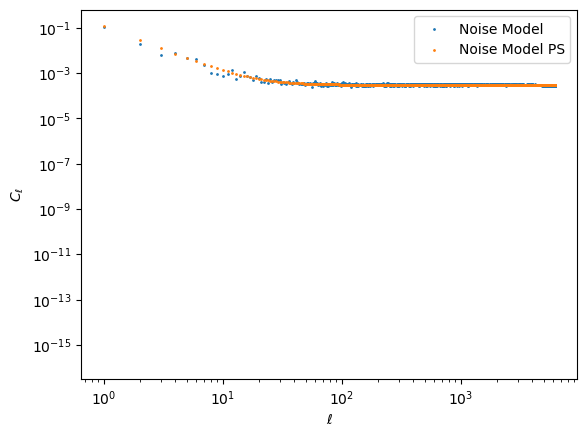

In [40]:
plt.figure()
plt.scatter(ell, test_ps, s = 1, label="Noise Model")
plt.scatter(ell, noise_model_ps, s = 1, label="Noise Model PS")
plt.xscale('log')
plt.yscale('log')
plt.xlabel("$\\ell$")
plt.ylabel("$C_{\\ell}$")
plt.legend()
plt.show()

# White Noise, from Power Spectrum

In [60]:
lmax = get_lmax_for_nside(nside)
sigma_K_CMB = sigma_uK_CMB / 1e6
wn_ps_K_CMB_2 = np.ones(lmax) * (sigma_K_CMB ** 2 / resol**2 * 3600)
# wn_ps_uK_CMB_2 = np.ones(lmax) * (sigma_uK_CMB ** 2)

In [61]:
np.random.seed(42)
# wn_ps_map_unk_units = hp.synfast(wn_ps_uK_CMB_2, nside, new=True)
wn_ps_map_K_CMB = hp.synfast(wn_ps_K_CMB_2, nside, new=True)
wn_ps_map_uK_CMB = wn_ps_map_K_CMB * 1e6  # This works approximately, but I don't know how to justify it

In [62]:
wn_ps_map_cl = hp.anafast(wn_ps_map_uK_CMB, lmax=lmax)
wn_ps_map_dl = convert_cl_to_dl(wn_ps_map_cl, lmax)

In [63]:
recs.add("wn_ps", "White Noise from Power Spectrum", wn_ps_map_uK_CMB, wn_ps_map_dl)

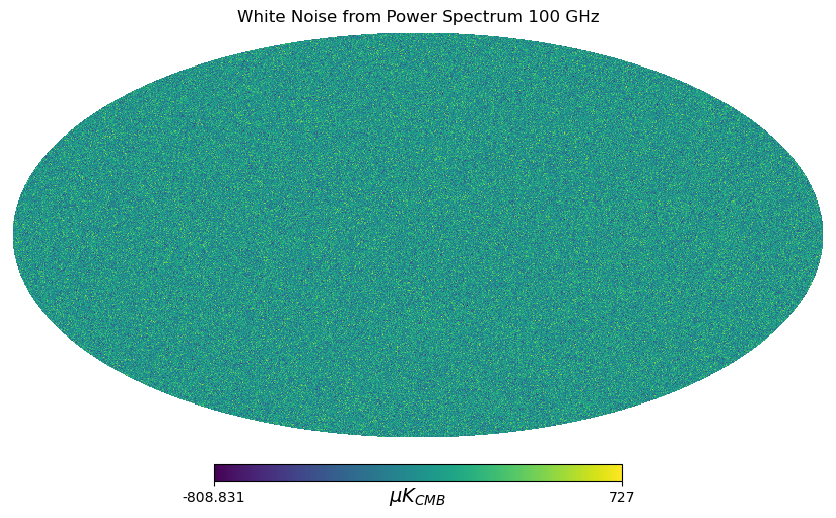

In [64]:
hp.mollview(wn_ps_map_K_CMB, unit=MAP_UNIT, title=recs.get("wn_ps").label + f" {DETECTOR} GHz")

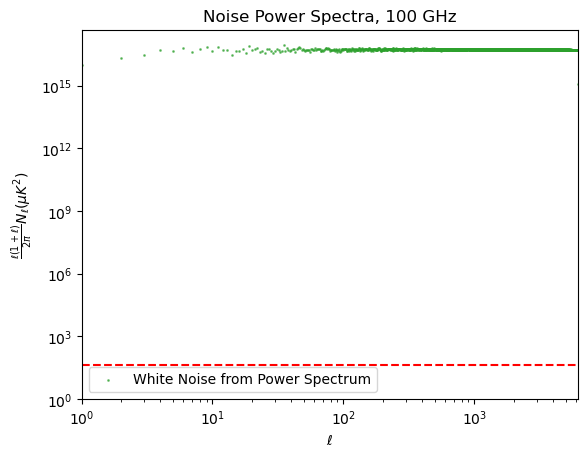

In [65]:
plot_ps(wn_ps_map_dl,
        title=f"Noise Power Spectra, {DETECTOR} GHz",
        labels=recs.get("wn_ps").label, 
        xlim=ell_max,
        colors=recs.get("wn_ps").color,
        helper_funcs=make_noise_level_adder(np.sqrt(sigma_uK_CMB),1))

# Noise from Variance Map

Record 2

In [66]:
# Setup to get maps... this is all naming convention stuff
if DETECTOR in [30, 44, 70]:
    instrument = "LFI"
    use_freq_str = format_freq(DETECTOR) + "-BPassCorrected"
    rev = "R3.00"
    obs_nside = 1024
else:
    instrument = "HFI"
    use_freq_str = format_freq(DETECTOR)
    rev = "R3.01"
    obs_nside = 2048
if DETECTOR == 353:
    use_freq_str = format_freq(DETECTOR) + "-psb"

obs_map_fn = planck_obs_fn.format(instrument=instrument, frequency=use_freq_str, rev=rev, obs_nside=obs_nside)
obs_map = get_map_data(obs_map_fn, url_template_maps)

File /data/jim/CMB_Data/Assets/Planck/HFI_SkyMap_100_2048_R3.01_full.fits does not exist; downloading.


KeyboardInterrupt: 

In [28]:
# Copied from cmb-ml's sims/physics_instrument_noise.py
def _change_variance_map_resolution(m, nside_out):
    # For variance maps, because statistics
    power = 2

    # From PySM3 template.py's read_map function, with minimal alteration (added 'power'):
    m_dtype = fits_inspect.get_map_dtype(m)
    nside_in = hp.get_nside(m)
    if nside_out < nside_in:  # do downgrading in double precision
        m = hp.ud_grade(m.astype(np.float64), power=power, nside_out=nside_out)
    elif nside_out > nside_in:
        m = hp.ud_grade(m, power=power, nside_out=nside_out)
    m = m.astype(m_dtype, copy=False)
    # End of used portion
    return m

def _get_sqrt_unit(src_unit):
    # Can't use PySM3's read_map() function because
    #     astropy.units will not parse "(K_CMB)^2" (I think)
    ok_units_k_cmb = ["(K_CMB)^2", "Kcmb^2"]
    ok_units_mjysr = ["(Mjy/sr)^2"]
    ok_units = [*ok_units_k_cmb, *ok_units_mjysr]
    if src_unit not in ok_units:
        raise ValueError(f"Wrong unit found in fits file. Found {src_unit}, expected one of {ok_units}.")
    if src_unit in ok_units_k_cmb:
        sqrt_unit = "K_CMB"
    else:
        sqrt_unit = "MJy/sr"
    return sqrt_unit

In [29]:
cen_freq = CENTER_FREQS[DETECTOR]

In [30]:
def make_planck_sd_map():
    planck_obs_path = Path(ASSETS_DIRECTORY) / obs_map_fn
    II_cov_field = 4
    source_obs_map = hp.read_map(planck_obs_path, hdu=1, field=II_cov_field)  

    m = _change_variance_map_resolution(source_obs_map, nside)
    m = np.sqrt(m)

    return m

In [31]:
def make_random_noise_map(sd_map, random_seed):
    """
    Make a random noise map.

    Args:
        sd_map (np.ndarray): The standard deviation map created with planck_result_to_sd_map.
        random_seed (int): The seed for the random number generator.
        center_frequency (float): The center frequency of the detector.
    """
    rng = np.random.default_rng(random_seed)
    noise_map = rng.normal(scale=sd_map)
    # noise_map = u.Quantity(noise_map, u.K_CMB, copy=False)
    return noise_map

In [32]:
sd_map = make_planck_sd_map()

In [33]:
var_map = make_random_noise_map(sd_map, random_seed=42) * 1e6

In [34]:
var_map_cl = hp.anafast(var_map, lmax=lmax)
var_map_dl = convert_cl_to_dl(var_map_cl, lmax)

In [35]:
recs.add("var_map", "Variance Map", var_map, var_map_dl)

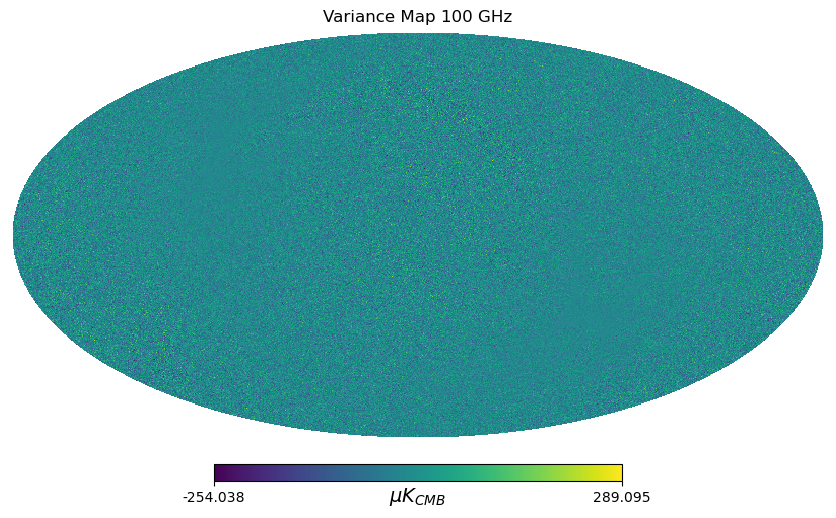

In [36]:
hp.mollview(var_map, unit=MAP_UNIT, title=recs.get("var_map").label + f" {DETECTOR} GHz")

# display_map_helper(recs)

In [28]:
plot_ps(var_map_dl,
        title=f"Noise Power Spectra, {DETECTOR} GHz",
        labels=recs.get("var_map").label, 
        xlim=ell_max,
        colors=recs.get("var_map").color,
        helper_funcs=make_noise_level_adder(sigma_uK_CMB, resol**2*3600))

# display_ps_helper(recs)

NameError: name 'var_map_dl' is not defined

# Planck's Noise Simulation

## Original

Record 3

In [67]:
ring_cut = "full"
realization = 0  # Which of the noise simulations to use; 300 exist

### Download & inspect the file

In [68]:
fn = planck_noise_fn_template.format(
                                    frequency=format_freq(DETECTOR), 
                                    ring_cut=ring_cut, 
                                    realization=format_real(realization))
get_map_data(fn, url_template_sims)

File /data/jim/CMB_Data/Assets/Planck/ffp10_noise_100_full_map_mc_00000.fits does not exist; downloading.
Downloaded ffp10_noise_100_full_map_mc_00000.fits


In [69]:
def get_units_of_map(fn):
    with fits.open(fn) as hdul:
        units = hdul[1].header["TUNIT1"]
    return units
get_units_of_map(fn)

'K_CMB'

In [70]:
planck_sim = hp.read_map(fn)
planck_sim = planck_sim * 1e6  # Convert from K_CMB to uK_CMB

In [71]:
planck_map_cl = hp.anafast(planck_sim, lmax=lmax)

In [72]:
planck_map_dl = convert_cl_to_dl(planck_map_cl, lmax)

In [73]:
recs.add("planck_sim", "Planck Simulated Noise", planck_sim, planck_map_dl)

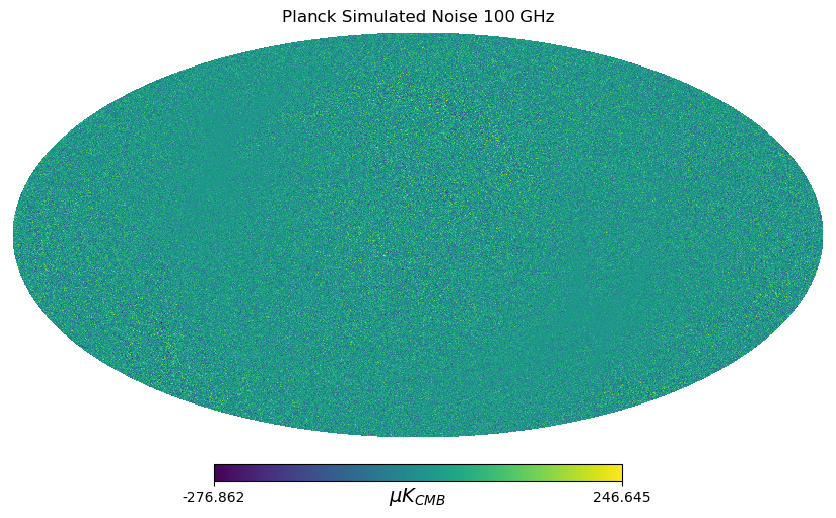

In [74]:
hp.mollview(planck_sim, unit=MAP_UNIT, title=recs.get("planck_sim").label + f" {DETECTOR} GHz")

# display_map_helper(recs)

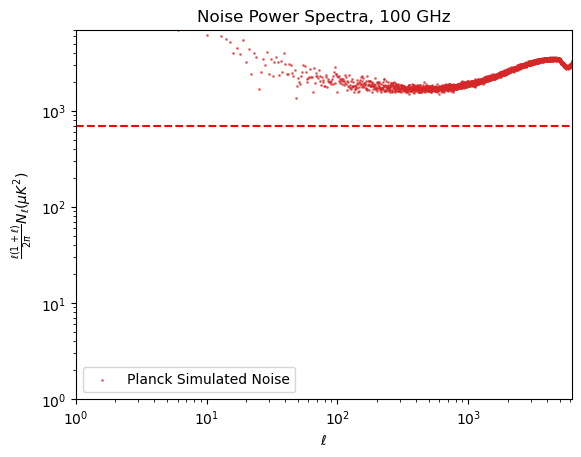

In [75]:
plot_ps(planck_map_dl,
        title=f"Noise Power Spectra, {DETECTOR} GHz",
        labels=recs.get("planck_sim").label, 
        xlim=ell_max,
        ylim=7000,
        colors=recs.get("planck_sim").color,
        helper_funcs=make_noise_level_adder(sigma_uK_CMB, resol**2*3600))

# display_ps_helper(recs)

## Derived

In [76]:
cl = planck_map_cl
cl[0] = 0
cl[1] = 0
sim_ps_sim_map = hp.synfast(cl, nside=2048, lmax=ell_max)

In [77]:
sim_ps_sim_map_cl = hp.anafast(sim_ps_sim_map, lmax=lmax)
sim_ps_sim_map_dl = convert_cl_to_dl(sim_ps_sim_map_cl, lmax)

# sim_ps_sim_ps = get_auto_ps_result(map_=sim_ps_sim_map,
#                                   mask=None,
#                                   lmax=ell_max,
#                                   beam=NoBeam(lmax=ell_max),
#                                   is_convolved=False)

In [78]:
recs.add("sim_ps_sim", "Planck Sim PS Sim", sim_ps_sim_map, sim_ps_sim_map_dl)

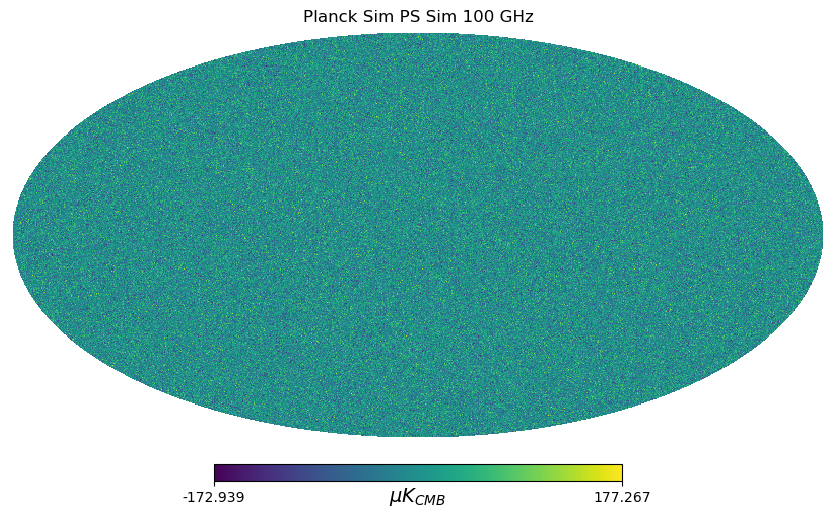

In [79]:
hp.mollview(sim_ps_sim_map, unit=MAP_UNIT, title=recs.get("sim_ps_sim").label + f" {DETECTOR} GHz")

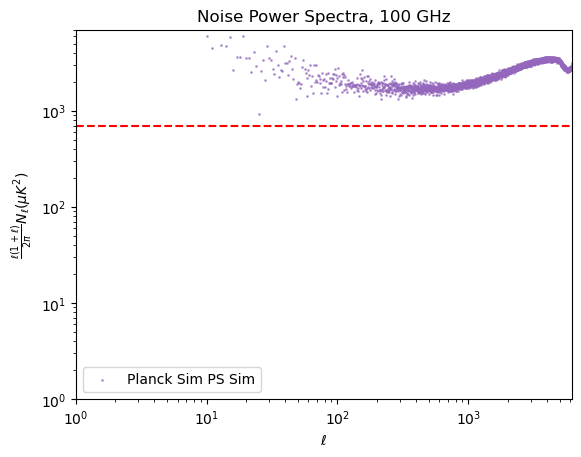

In [80]:
plot_ps(sim_ps_sim_map_dl,
        title=f"Noise Power Spectra, {DETECTOR} GHz",
        labels=recs.get("sim_ps_sim").label, 
        xlim=ell_max,
        ylim=7000,
        colors=recs.get("sim_ps_sim").color,
        helper_funcs=make_noise_level_adder(sigma_uK_CMB, resol**2*3600))

# display_ps_helper(recs)

## Compare Power Spectra before and after second simulation

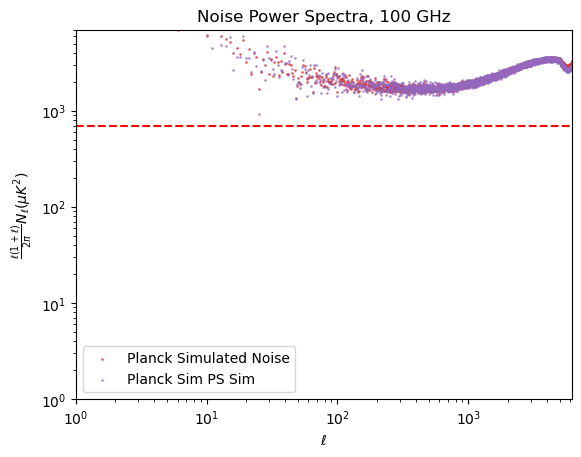

In [82]:
plot_ps(recs.get_dls(["planck_sim", "sim_ps_sim"]),
        title=f"Noise Power Spectra, {DETECTOR} GHz",
        labels=recs.get_labels(["planck_sim", "sim_ps_sim"]), 
        xlim=ell_max,
        ylim=7000,
        colors=recs.get_colors(["planck_sim", "sim_ps_sim"]),
        helper_funcs=make_noise_level_adder(sigma_uK_CMB, resol**2*3600))

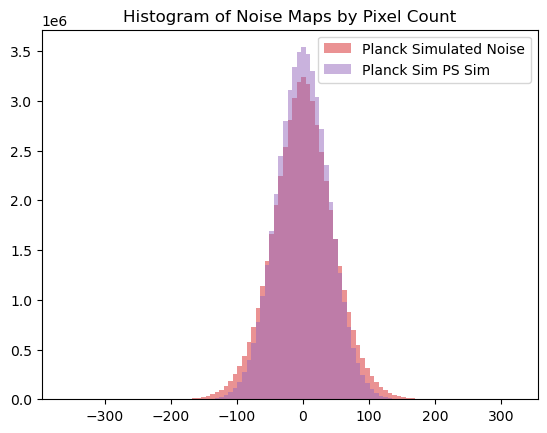

In [83]:
use_these = ["planck_sim", "sim_ps_sim"]
make_histograms(recs, use_these)

In [56]:
planck_sim.shape, sim_ps_sim_map.shape

((50331648,), (50331648,))

In [57]:
hp.get_nside(planck_sim), hp.get_nside(sim_ps_sim_map)

(2048, 2048)

# Getting Half-Mission Maps Noise

In [58]:
if DETECTOR in [30, 44, 70]:
    instrument = "LFI"
else:
    instrument = "HFI"
hm_1_fn = hm_map_fn_template.format(instrument=instrument, freq=format_freq(DETECTOR), hm=1)
hm_2_fn = hm_map_fn_template.format(instrument=instrument, freq=format_freq(DETECTOR), hm=2)
get_map_data(hm_1_fn, url_template_maps)
get_map_data(hm_2_fn, url_template_maps)

File /data/jim/CMB_Data/Assets/Planck/HFI_SkyMap_100_2048_R3.01_halfmission-1.fits exists.
File /data/jim/CMB_Data/Assets/Planck/HFI_SkyMap_100_2048_R3.01_halfmission-2.fits exists.


In [59]:
def get_units_of_map(fn):
    with fits.open(fn) as hdul:
        units = hdul[1].header["TUNIT1"]
    return units
get_units_of_map(hm_1_fn)

'Kcmb'

In [60]:
this_hm_1_map = hp.read_map(hm_1_fn)
this_hm_2_map = hp.read_map(hm_2_fn)

In [61]:
# Convert to masked maps, and from K_CMB to uK_CMB
this_hm_1_map = hp.ma(this_hm_1_map) * 1e6
this_hm_2_map = hp.ma(this_hm_2_map) * 1e6

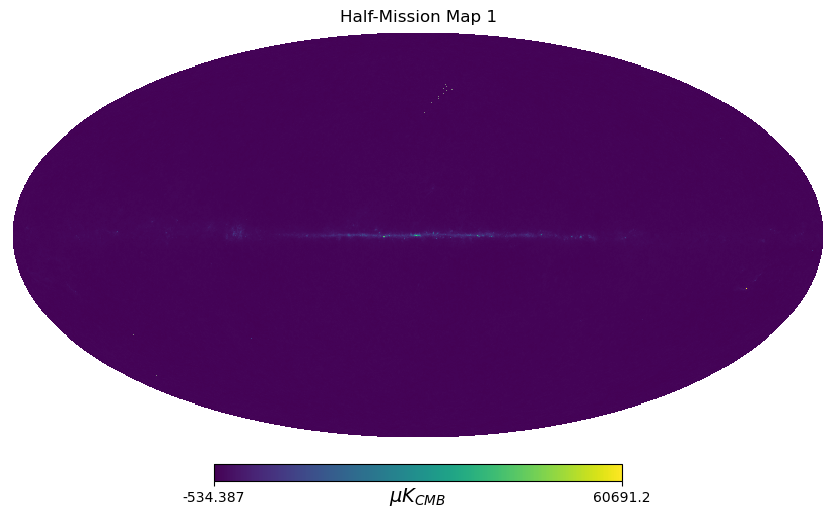

In [62]:
hp.mollview(this_hm_1_map, unit=MAP_UNIT, title="Half-Mission Map 1")

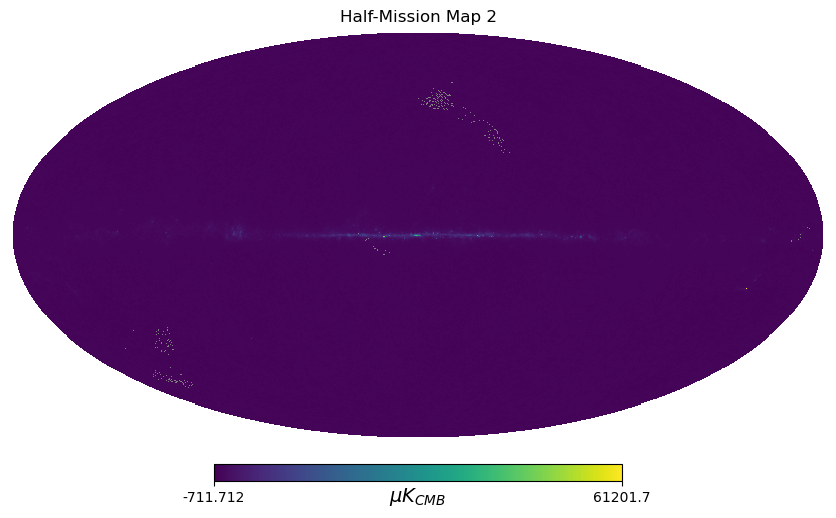

In [63]:
hp.mollview(this_hm_2_map, unit=MAP_UNIT, title="Half-Mission Map 2")

In [64]:
mask1 = this_hm_1_map.mask
mask2 = this_hm_2_map.mask

full_mask = mask1 | mask2

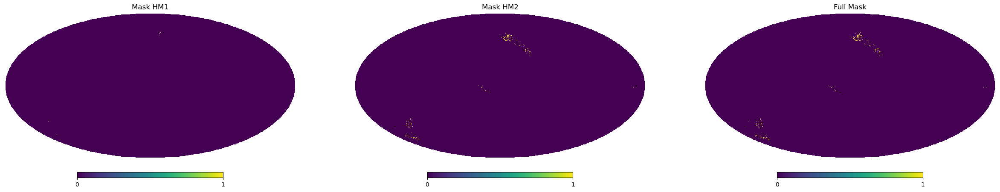

In [65]:
fig, axs = plt.subplots(1, 3, figsize=(30, 8))
plt.axes(axs[0])
hp.mollview(mask1, title="Mask HM1", hold=True)
plt.axes(axs[1])
hp.mollview(mask2, title="Mask HM2", hold=True)
plt.axes(axs[2])
hp.mollview(full_mask, title="Full Mask", hold=True)

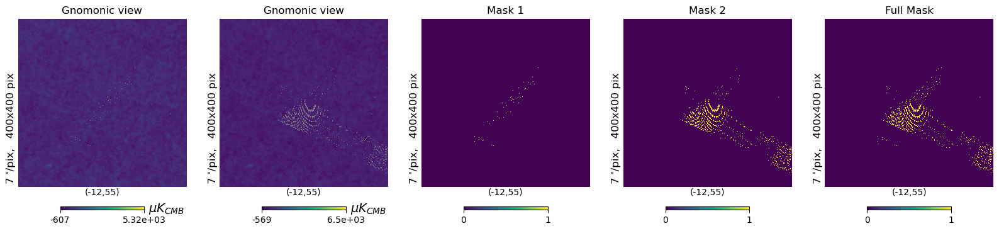

In [66]:
view_params = dict(rot=[-12, 55], xsize=400, reso=7, hold=True)
fig, axs = plt.subplots(1, 5, figsize=(20, 5))
plt.axes(axs[0])
hp.gnomview(this_hm_1_map, unit=MAP_UNIT, **view_params)
plt.axes(axs[1])
hp.gnomview(this_hm_2_map, unit=MAP_UNIT, **view_params)
plt.axes(axs[2])
hp.gnomview(mask1, title="Mask 1", **view_params)
plt.axes(axs[3])
hp.gnomview(mask2, title="Mask 2", **view_params)
plt.axes(axs[4])
hp.gnomview(full_mask, title="Full Mask", **view_params)

In [67]:
hm_noise_map = this_hm_1_map - this_hm_2_map
hm_noise_map = hp.ma(hm_noise_map) / 2
hm_noise_map.mask = full_mask

In [68]:
hm_noise_cl = hp.anafast(hm_noise_map, lmax=lmax)
hm_noise_dl = convert_cl_to_dl(hm_noise_cl, lmax)

In [69]:
recs.add("hm", "Half-Mission Difference Map", hm_noise_map, hm_noise_dl)

In [70]:
hm_title = recs.get("hm").label + f" {DETECTOR} GHz"

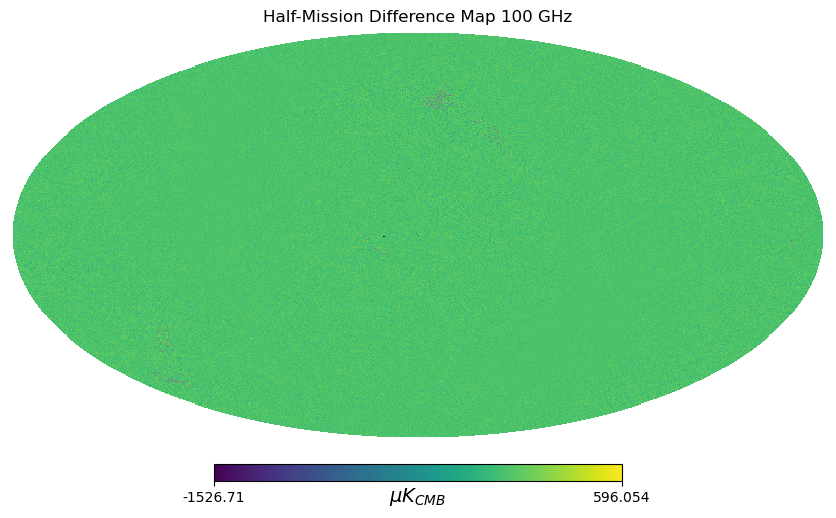

In [71]:
hp.mollview(hm_noise_map, unit=MAP_UNIT, title=hm_title)

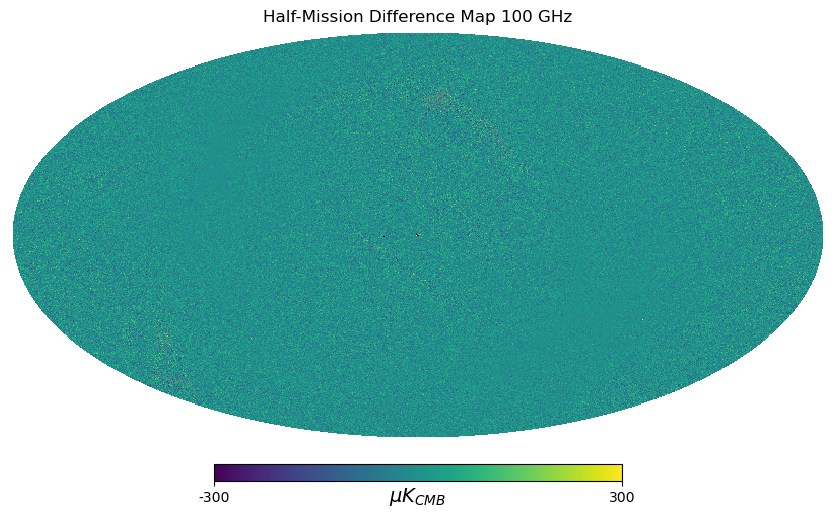

In [72]:
hp.mollview(hm_noise_map, unit=MAP_UNIT, title=hm_title, min=-300, max=300)

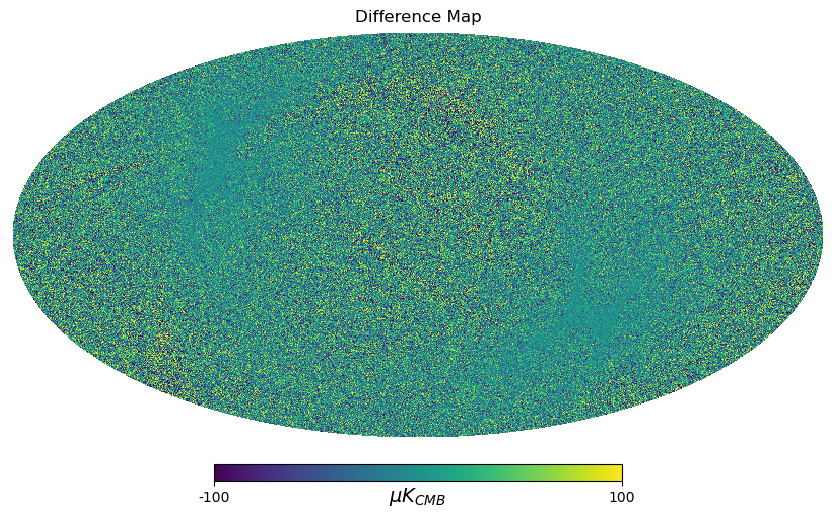

In [73]:
# Plotting to highlight anisotropy (by changing the min and max values of the color scale)
hp.mollview(hm_noise_map, unit=MAP_UNIT, title="Difference Map", min=-100, max=100)

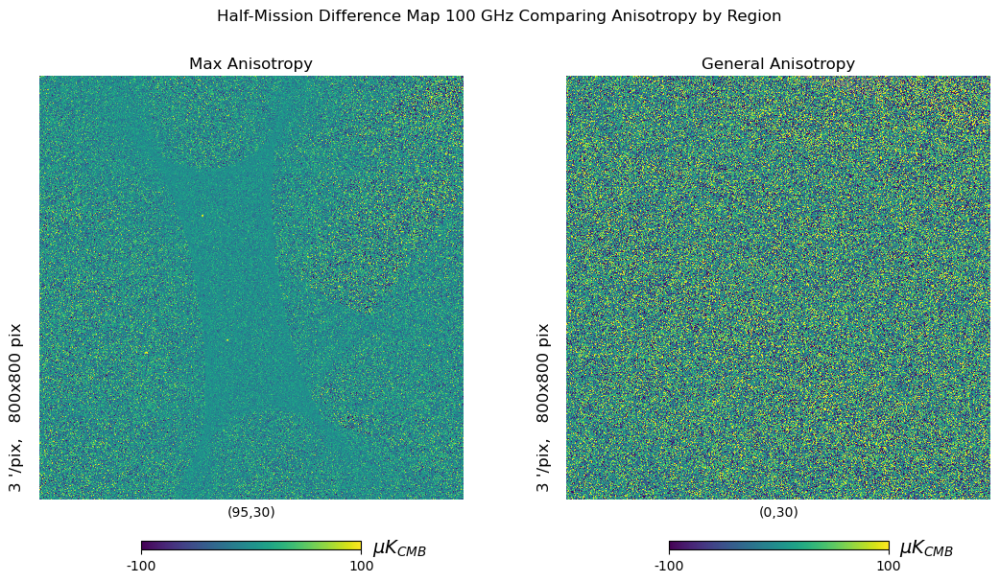

In [74]:
plot_params = dict(xsize=800, unit=MAP_UNIT, min=-100, max=100, reso=3, hold=True)
fig, axs = plt.subplots(1, 2, figsize=(13, 7))
plt.axes(axs[0])
hp.gnomview(hm_noise_map, rot=[95, 30], title="Max Anisotropy", **plot_params)
plt.axes(axs[1])
hp.gnomview(hm_noise_map, rot=[0, 30], title="General Anisotropy", **plot_params)
plt.suptitle(hm_title + " Comparing Anisotropy by Region");
# plt.axes(axs[2])
# hp.mollview(diff_map, title="", min=-100, max=100, hold=True)

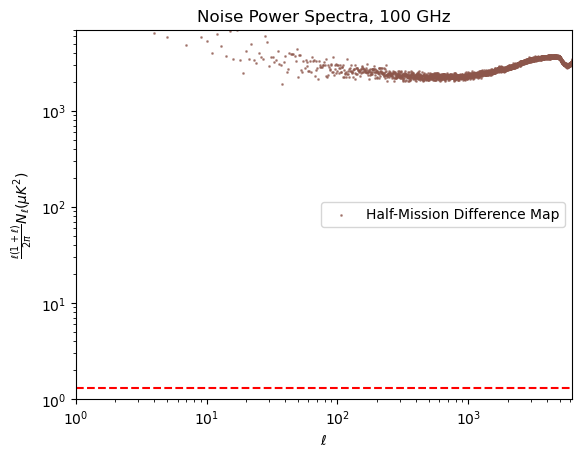

In [75]:
plot_ps(recs.get("hm").dl,
        title=f"Noise Power Spectra, {DETECTOR} GHz",
        labels=recs.get("hm").label, 
        xlim=ell_max,
        ylim=7000,
        colors=recs.get("hm").color,
        helper_funcs=make_noise_level_adder(sigma_per_deg))

# Comparing Results

Showing the (first of 300) Planck Noise simulation (A), a noise map created from the power spectrum of A, and the difference between the Half-Mission maps.

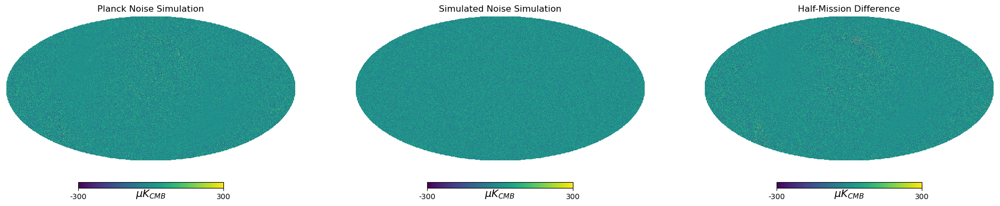

In [76]:
plot_params = dict(min=-300, max=300, hold=True)
fig, axs = plt.subplots(1, 3, figsize=(24, 10))
plt.axes(axs[0])
hp.mollview(planck_sim, unit=MAP_UNIT, title="Planck Noise Simulation", **plot_params)
plt.axes(axs[1])
hp.mollview(sim_ps_sim_map, unit=MAP_UNIT, title="Simulated Noise Simulation", **plot_params)
plt.axes(axs[2])
hp.mollview(hm_noise_map, unit=MAP_UNIT, title="Half-Mission Difference", **plot_params)
# plt.suptitle(f"Noise Maps, {frequency} GHz");

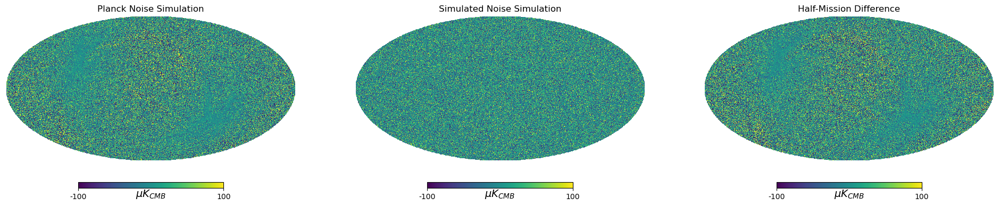

In [77]:
plot_params = dict(min=-100, max=100, hold=True)
fig, axs = plt.subplots(1, 3, figsize=(24, 10))
plt.axes(axs[0])
hp.mollview(planck_sim, unit=MAP_UNIT, title="Planck Noise Simulation", **plot_params)
plt.axes(axs[1])
hp.mollview(sim_ps_sim_map, unit=MAP_UNIT, title="Simulated Noise Simulation", **plot_params)
plt.axes(axs[2])
hp.mollview(hm_noise_map, unit=MAP_UNIT, title="Half-Mission Difference", **plot_params)
# plt.suptitle(f"Noise Maps, {frequency} GHz");

# Comparing Results

### Map-Level

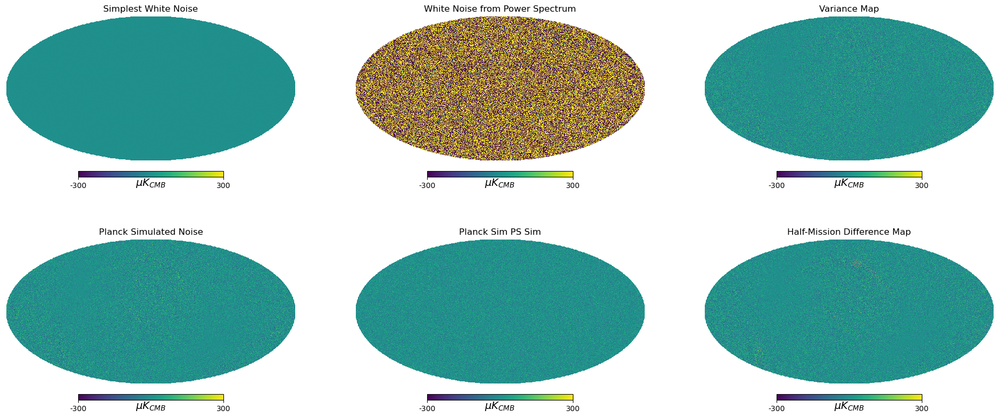

In [78]:
plot_params = dict(min=-300, max=300, hold=True)
fig, axs = plt.subplots(2, 3, figsize=(24, 10))
for i, rec in enumerate(recs.get_all()):
    fig_loc = (i // 3, i % 3)
    plt.axes(axs[fig_loc])
    hp.mollview(rec.sky, unit=MAP_UNIT, title=rec.label, **plot_params)

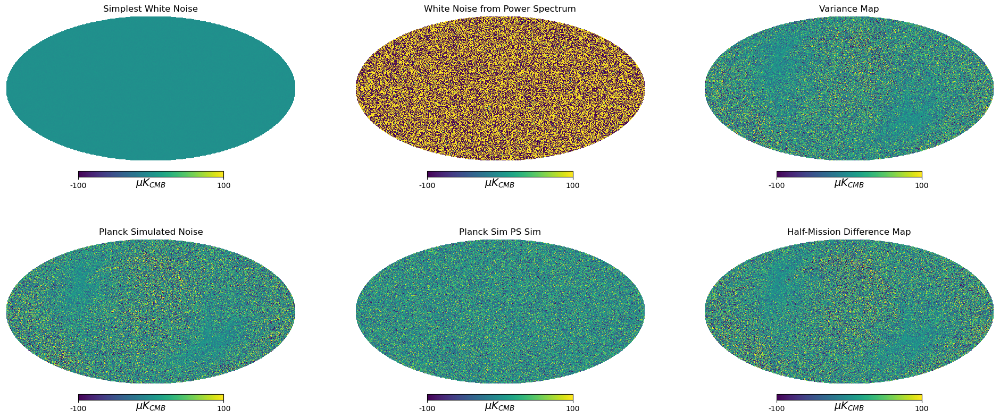

In [79]:
plot_params = dict(min=-100, max=100, hold=True)
fig, axs = plt.subplots(2, 3, figsize=(24, 10))
for i, rec in enumerate(recs.get_all()):
    fig_loc = (i // 3, i % 3)
    plt.axes(axs[fig_loc])
    hp.mollview(rec.sky, unit=MAP_UNIT, title=rec.label, **plot_params)

### PS-Level

Note that in the following figures, the Simplest White Noise and White Noise from Power Spectrum data is off the scale; it's shown at the end.

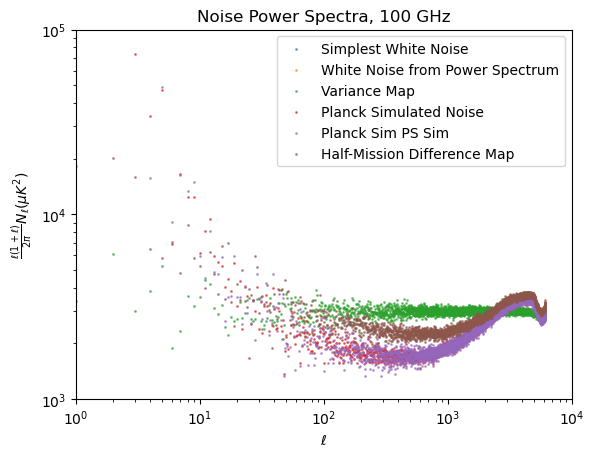

In [80]:
plot_ps([r.dl for r in recs.get_all()],
        title=f"Noise Power Spectra, {DETECTOR} GHz",
        labels=[r.label for r in recs.get_all()], 
        xlim=1e4,
        ylim_low=1e3,
        ylim=1e5,
        colors=[r.color for r in recs.get_all()],
        helper_funcs=make_noise_level_adder(sigma_per_deg))

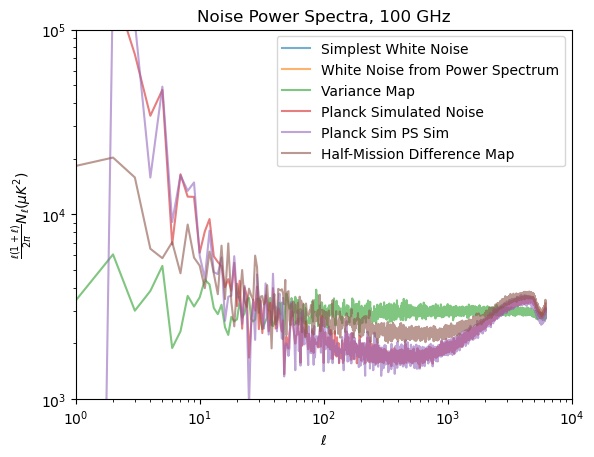

In [81]:
plot_ps([r.dl for r in recs.get_all()],
         title=f"Noise Power Spectra, {DETECTOR} GHz",
         labels=[r.label for r in recs.get_all()], 
         xlim=1e4,
         ylim_low=1e3,
         ylim=1e5,
         colors=[r.color for r in recs.get_all()],
         scatter=False,
         helper_funcs=make_noise_level_adder(sigma_per_deg))

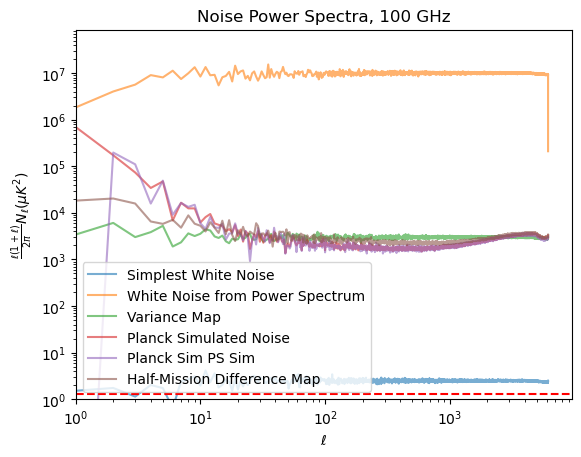

In [82]:
plot_ps([r.dl for r in recs.get_all()],
        title=f"Noise Power Spectra, {DETECTOR} GHz",
        labels=[r.label for r in recs.get_all()], 
        # xlim=1e4,
        # ylim_low=1e3,
        # ylim=1e5,
        colors=[r.color for r in recs.get_all()],
        scatter=False,
        helper_funcs=make_noise_level_adder(sigma_per_deg))

In [83]:
print([r.name for r in recs.get_all()])

['wn_simplest', 'wn_ps', 'var_map', 'planck_sim', 'sim_ps_sim', 'hm']


### Histograms

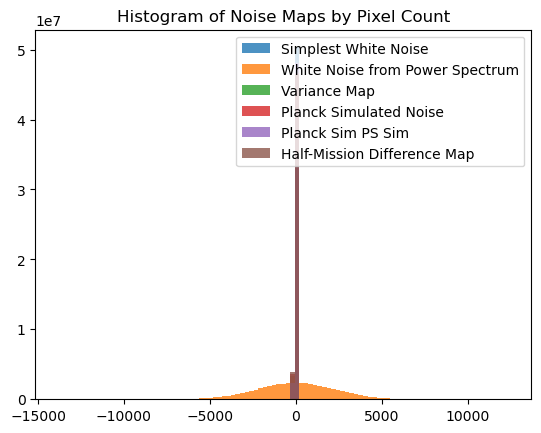

In [84]:
use_these = [r.name for r in recs.get_all()]
make_histograms(recs, use_these)

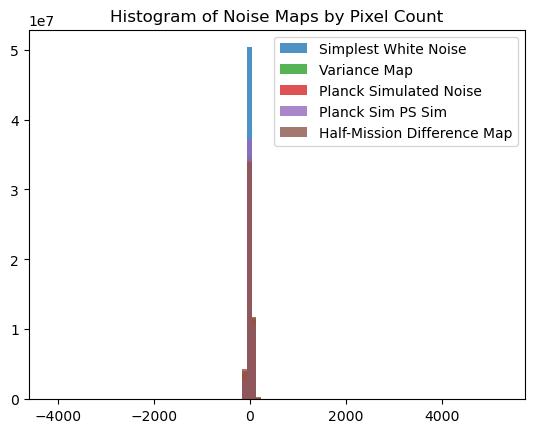

In [85]:
use_these = ['wn_simplest', 'var_map', 'planck_sim', 'sim_ps_sim', 'hm']
make_histograms(recs, use_these)
# oal_min = None
# oal_max = None
# for use_this in use_these:
#     this_sky = recs.get(use_this).sky
#     this_min = this_sky.min()
#     this_max = this_sky.max()
#     oal_min = this_min if oal_min is None else min(oal_min, this_min)
#     oal_max = this_max if oal_max is None else max(oal_max, this_max)
# bins = np.linspace(oal_min, oal_max, 100)

# plt.figure()
# for use_this in use_these:
#     rec = recs.get(use_this)
#     plt.hist(rec.sky, bins=1000, alpha=0.5, label=rec.label, color=rec.color)
# plt.legend()
# plt.title("Histogram of Noise Maps by Pixel Count")
# plt.show()

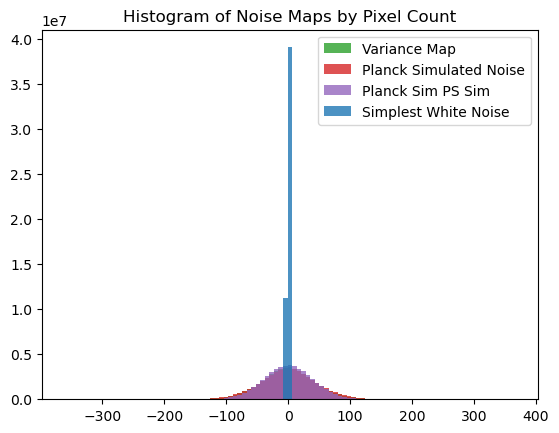

In [86]:
use_these = ['var_map', 'planck_sim', 'sim_ps_sim', 'wn_simplest']
make_histograms(recs, use_these)
# oal_min = None
# oal_max = None
# for use_this in use_these:
#     this_sky = recs.get(use_this).sky
#     this_min = this_sky.min()
#     this_max = this_sky.max()
#     oal_min = this_min if oal_min is None else min(oal_min, this_min)
#     oal_max = this_max if oal_max is None else max(oal_max, this_max)
# bins = np.linspace(oal_min, oal_max, 100)

# plt.figure()
# for use_this in use_these:
#     rec = recs.get(use_this)
#     plt.hist(rec.sky, bins=bins, alpha=0.8, label=rec.label, color=rec.color)
# plt.legend()
# plt.title("Histogram of Noise Maps by Pixel Count")
# plt.show()

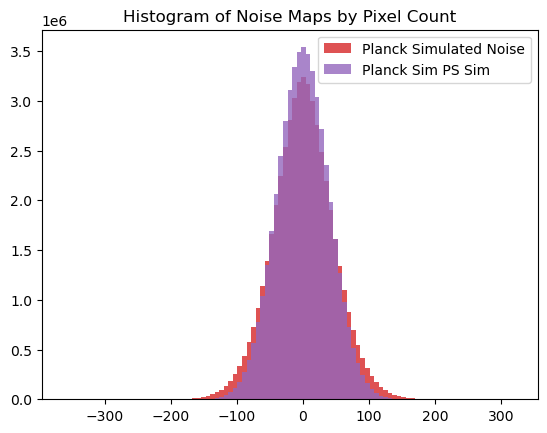

In [87]:
use_these = ['planck_sim', 'sim_ps_sim']
make_histograms(recs, use_these)
# plt.figure()
# oal_min = None
# oal_max = None
# for use_this in use_these:
#     this_sky = recs.get(use_this).sky
#     this_min = this_sky.min()
#     this_max = this_sky.max()
#     oal_min = this_min if oal_min is None else min(oal_min, this_min)
#     oal_max = this_max if oal_max is None else max(oal_max, this_max)
# bins = np.linspace(oal_min, oal_max, 100)
# for use_this in use_these:
#     rec = recs.get(use_this)
#     plt.hist(rec.sky, bins=bins, alpha=0.5, label=rec.label, color=rec.color)
# plt.legend()
# # plt.ylim([0, 100])
# plt.title(f"Histogram of Noise Maps by Pixel Count, {DETECTOR} GHz")
# plt.show()

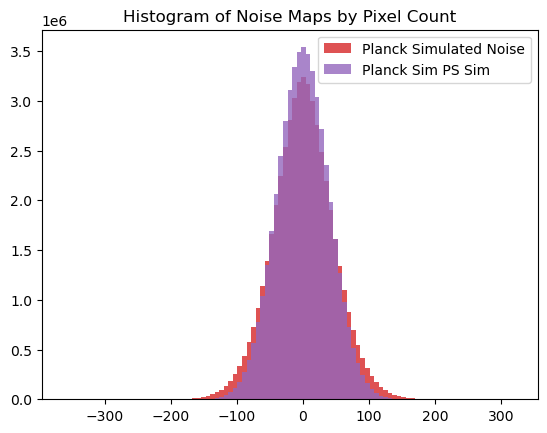

In [88]:
use_these = ['planck_sim', 'sim_ps_sim']
make_histograms(recs, use_these)

# plt.figure()
# hist_res = []
# for use_this in use_these:
#     rec = recs.get(use_this)
#     hist_res.append(plt.hist(rec.sky, bins=10, alpha=0.5, label=rec.label, color=rec.color))
# plt.legend()
# plt.title("Histogram of Noise Maps by Pixel Count")
# plt.show()

In [89]:
counts0, bins0, _ = hist_res[0]
counts1, bins1, _ = hist_res[1]

counts0.sum(), counts1.sum()

NameError: name 'hist_res' is not defined

In [ ]:
len(bins0), len(bins1)

In [ ]:
print(counts0, counts1)

In [ ]:
cumsum0 = 0
cumsum1 = 0
for i in range(counts0.shape[0]):
    print(f"Bin {i}: {counts0[i]:>10}, {counts1[i]:>10}")

Comparing anisotropic regions

In [ ]:
# plot_params = dict(xsize=800, rot=[95, 30], min=-50, max=50, reso=3, hold=True)

# fig, axs = plt.subplots(1, 4, figsize=(24, 5.5))
# plt.axes(axs[0])
# hp.gnomview(noise_from_var_map, unit=map_unit, title="Planck Sim", **plot_params)
# plt.axes(axs[1])
# hp.gnomview(planck_sim, unit=map_unit, title="Planck Sim", **plot_params)
# plt.axes(axs[2])
# hp.gnomview(sim_ps_sim_map, unit=map_unit, title="Sim PS Sim", **plot_params)
# plt.axes(axs[3])
# hp.gnomview(hm_noise_map, unit=map_unit, title="Half-Mission Difference", **plot_params)